In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install geopy

Note: you may need to restart the kernel to use updated packages.


In [3]:
!jupyter trust Main.ipynb

Notebook already signed: Main.ipynb


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from collections import defaultdict
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1. Data Exploration & Pre-Processing

In [5]:
data = pd.read_csv("Dataset .csv")
data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [6]:
data.shape

(9551, 21)

In [7]:
data.isna().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [8]:
rows_with_missing = data[data.isna().any(axis=1)]
print(rows_with_missing)

     Restaurant ID                 Restaurant Name  Country Code  \
84        17284105                   Cookie Shoppe           216   
87        17284211  Pearly's Famous Country Cookng           216   
94        17284158               Jimmie's Hot Dogs           216   
297       17374552                  Corkscrew Cafe           216   
328       17501439                        Dovetail           216   
346       17606621            HI Lite Bar & Lounge           216   
368       17059060                       Hillstone           216   
418       17142698                Leonard's Bakery           216   
455       17616465        Tybee Island Social Club           216   

               City                                          Address  \
84           Albany               115 N Jackson St, Albany, GA 31701   
87           Albany             814 N Slappey Blvd, Albany, GA 31701   
94           Albany               204 S Jackson St, Albany, GA 31701   
297     Gainesville            

In [9]:
data['Cuisines'].fillna('Unknown')
data.to_csv("C:\\Users\\viswa\\Downloads\\Dataset.csv", index=False)

In [10]:
data['Restaurant ID'] = data['Restaurant ID'].astype(str)
print(data.dtypes['Restaurant ID'])

object


In [11]:
data['Rating text'].value_counts()

Average      3737
Not rated    2148
Good         2100
Very Good    1079
Excellent     301
Poor          186
Name: Rating text, dtype: int64

In [12]:
unique_rating_texts = data['Rating text'].unique()
rating_patterns = {}
for rating_text in unique_rating_texts:
    filtered_data = data[data['Rating text'] == rating_text]
    stats = {
        'count': filtered_data['Aggregate rating'].count(),
        'mean': filtered_data['Aggregate rating'].mean(),
        'min': filtered_data['Aggregate rating'].min(),
        'max': filtered_data['Aggregate rating'].max()
    }
    rating_patterns[rating_text] = stats

In [13]:
rating_patterns

{'Excellent': {'count': 301,
  'mean': 4.659800664451827,
  'min': 4.5,
  'max': 4.9},
 'Very Good': {'count': 1079,
  'mean': 4.168118628359592,
  'min': 4.0,
  'max': 4.4},
 'Good': {'count': 2100, 'mean': 3.6834285714285713, 'min': 3.5, 'max': 3.9},
 'Average': {'count': 3737, 'mean': 3.051618945678352, 'min': 2.5, 'max': 3.4},
 'Not rated': {'count': 2148, 'mean': 0.0, 'min': 0.0, 'max': 0.0},
 'Poor': {'count': 186, 'mean': 2.2978494623655914, 'min': 1.8, 'max': 2.4}}

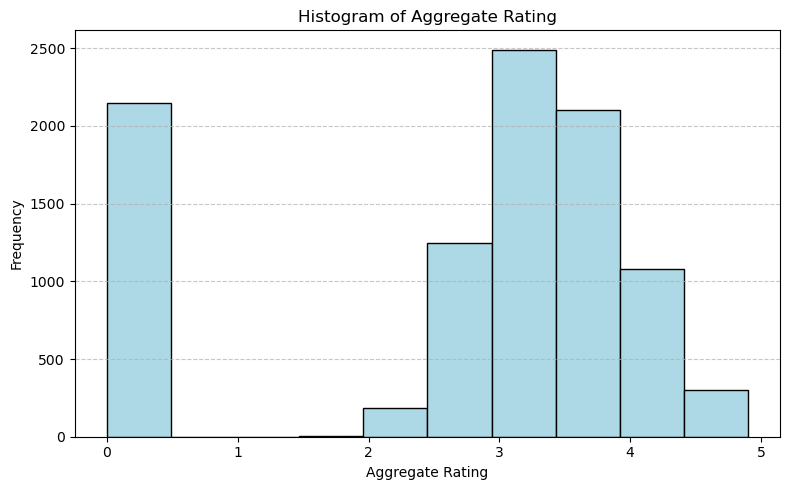

In [14]:
plt.figure(figsize=(8, 5))
data['Aggregate rating'].plot(kind='hist', bins=10, color='lightblue', edgecolor='black')
plt.title('Histogram of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

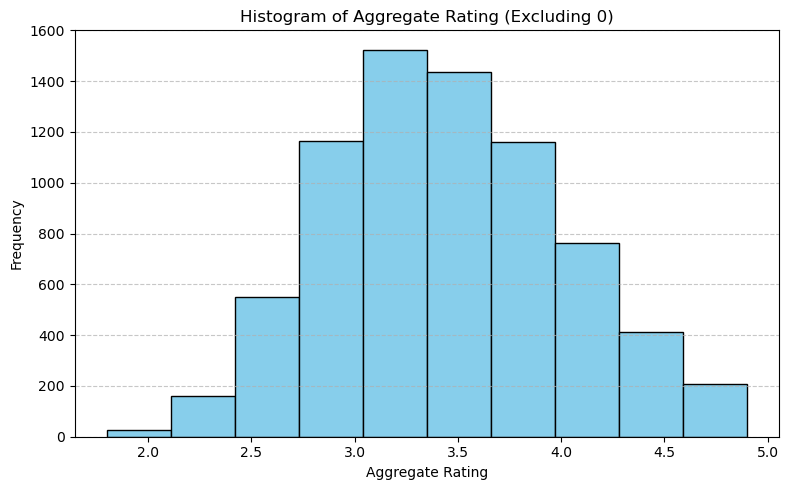

In [15]:
filtered_data = data[data['Aggregate rating'] != 0]
plt.figure(figsize=(8, 5))
filtered_data['Aggregate rating'].plot(kind='hist', bins=10, color='skyblue', edgecolor='black')
plt.title('Histogram of Aggregate Rating (Excluding 0)')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

The data follows an approximately normal distribution, centered around 3.5. There is moderate variation, with fewer extreme ratings. The distribution might be slightly right-skewed, suggesting a tendency towards higher ratings.

# 2. Descriptive Analysis

In [16]:
data.describe()

,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   object 
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [18]:
data['Country Code'].value_counts()

1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: Country Code, dtype: int64

In [19]:
data['City'].value_counts()

New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: City, Length: 141, dtype: int64

In [20]:
data.groupby(['Country Code'])['City'].nunique()

Country Code
1      43
14     23
30      3
37      4
94      4
148     2
162     9
166     1
184     1
189     6
191     1
208     2
214     3
215     4
216    35
Name: City, dtype: int64

In [21]:
cuisines_column = data['Cuisines']
unique_cuisines = set()
for cuisine_list in cuisines_column.dropna():  
    cuisines = [c.strip() for c in cuisine_list.split(',')] 
    unique_cuisines.update(cuisines)
unique_cuisines_list = sorted(unique_cuisines)

In [22]:
unique_cuisines_list

['Afghani',
 'African',
 'American',
 'Andhra',
 'Arabian',
 'Argentine',
 'Armenian',
 'Asian',
 'Asian Fusion',
 'Assamese',
 'Australian',
 'Awadhi',
 'BBQ',
 'Bakery',
 'Bar Food',
 'Belgian',
 'Bengali',
 'Beverages',
 'Bihari',
 'Biryani',
 'Brazilian',
 'Breakfast',
 'British',
 'Bubble Tea',
 'Burger',
 'Burmese',
 'B�_rek',
 'Cafe',
 'Cajun',
 'Canadian',
 'Cantonese',
 'Caribbean',
 'Charcoal Grill',
 'Chettinad',
 'Chinese',
 'Coffee and Tea',
 'Contemporary',
 'Continental',
 'Cuban',
 'Cuisine Varies',
 'Curry',
 'Deli',
 'Desserts',
 'Dim Sum',
 'Diner',
 'Drinks Only',
 'Durban',
 'D�_ner',
 'European',
 'Fast Food',
 'Filipino',
 'Finger Food',
 'Fish and Chips',
 'French',
 'Fusion',
 'German',
 'Goan',
 'Gourmet Fast Food',
 'Greek',
 'Grill',
 'Gujarati',
 'Hawaiian',
 'Healthy Food',
 'Hyderabadi',
 'Ice Cream',
 'Indian',
 'Indonesian',
 'International',
 'Iranian',
 'Irish',
 'Italian',
 'Izgara',
 'Japanese',
 'Juices',
 'Kashmiri',
 'Kebab',
 'Kerala',
 'Kiwi',


In [23]:
len(unique_cuisines_list)

145

In [24]:
cuisine_counts = data['Cuisines'].dropna().str.split(',').explode().str.strip().value_counts()
city_counts = data['City'].value_counts()
top_cuisines = cuisine_counts.head(10)
top_cities = city_counts.head(10)
print("Top Cuisines by Number of Restaurants:")
print(top_cuisines)
print("\nTop Cities by Number of restaurants:")
print(top_cities)

Top Cuisines by Number of Restaurants:
North Indian    3960
Chinese         2735
Fast Food       1986
Mughlai          995
Italian          764
Bakery           745
Continental      736
Cafe             703
Desserts         653
South Indian     636
Name: Cuisines, dtype: int64

Top Cities by Number of restaurants:
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: City, dtype: int64


In [25]:
data['Price range'].value_counts()

1    4444
2    3113
3    1408
4     586
Name: Price range, dtype: int64

In [26]:
unique_price_texts = data['Price range'].unique()
price_patterns = {}
for price in unique_price_texts:
    filtered_data = data[data['Price range'] == price]
    stats = {
        'count': filtered_data['Average Cost for two'].count(),
        'mean': filtered_data['Average Cost for two'].mean(),
        'min': filtered_data['Average Cost for two'].min(),
        'max': filtered_data['Average Cost for two'].max()
    }
    price_patterns[price] = stats

In [27]:
price_patterns

{3: {'count': 1408, 'mean': 5177.268465909091, 'min': 30, 'max': 800000},
 4: {'count': 586, 'mean': 1848.523890784983, 'min': 50, 'max': 8000},
 2: {'count': 3113, 'mean': 596.8262126566013, 'min': 15, 'max': 70000},
 1: {'count': 4444, 'mean': 275.18294329432945, 'min': 0, 'max': 450}}

# 3. Geospatial Analysis

In [28]:
country_mapping = {
    1: "India", 14: "Australia", 30: "Brazil", 148: "Canada", 162: "Indonesia",
    189: "New Zealand", 208: "Philippines", 214: "Qatar", 215: "Singapore", 
    216: "South Africa", 166: "Sri Lanka", 184: "Turkey", 191: "UAE", 
    234: "United Kingdom", 237: "United States"
}
data['Country'] = data['Country Code'].map(country_mapping)
unique_countries = data['Country'].dropna().unique()
data.to_csv("C:\\Users\\viswa\\Downloads\\Dataset.csv", index=False)

In [29]:
average_latitude = data['Latitude'].mean()
average_longitude = data['Longitude'].mean()
restaurant_map = folium.Map(location=[average_latitude, average_longitude], zoom_start=12)
for _, row in data.iterrows():
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=5,  
        color='blue',  
        fill=True,  
        fill_color='blue', 
        fill_opacity=0.6,  
        tooltip=f"{row['Restaurant Name']} ({row['Aggregate rating']})" 
    ).add_to(restaurant_map)
map_file_path = "restaurant_locations_map.html"  
restaurant_map.save(map_file_path)
restaurant_map

In [30]:
country_distribution = data['Country'].value_counts().reset_index()
country_distribution.columns = ['Country', 'Number of Restaurants']
fig = px.bar(
    country_distribution,
    x='Number of Restaurants',
    y='Country',
    orientation='h',
    text='Number of Restaurants', 
    labels={'Number of Restaurants': 'Number of Restaurants', 'Country': 'Country'},
    title="Distribution of Restaurants Across Countries"
)
fig.update_traces(textposition='outside')  
fig.update_layout(yaxis={'categoryorder': 'total ascending'})  
fig.show()

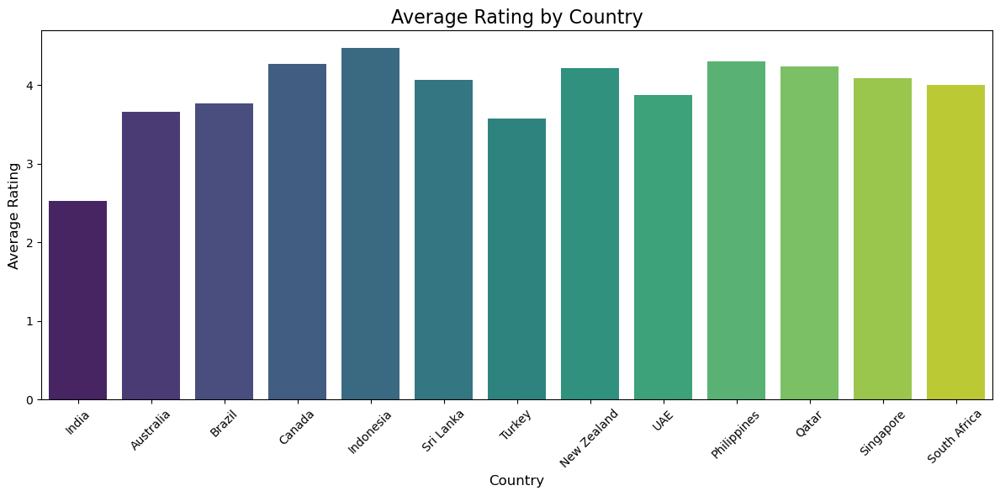

In [31]:
country_mapping = data[['Country Code', 'Country']].drop_duplicates()
country_avg_ratings = data.groupby('Country Code')['Aggregate rating'].mean().reset_index()
country_avg_ratings = country_avg_ratings.merge(country_mapping, on='Country Code', how='left')
country_avg_ratings = country_avg_ratings[['Country', 'Aggregate rating']]
country_avg_ratings.columns = ['Country', 'Average Rating']
plt.figure(figsize=(12, 6))
sns.barplot(x='Country', y='Average Rating', data=country_avg_ratings, palette='viridis')
plt.title('Average Rating by Country', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Average Rating', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()

In [32]:
country_avg_ratings

,Country,Average Rating
0,India,2.523324
1,Australia,3.658333
2,Brazil,3.763333
3,NaN,3.575000
4,NaN,4.295238
5,Canada,4.262500
6,Indonesia,4.468182
7,Sri Lanka,4.060000
8,Turkey,3.575000
9,New Zealand,4.210000


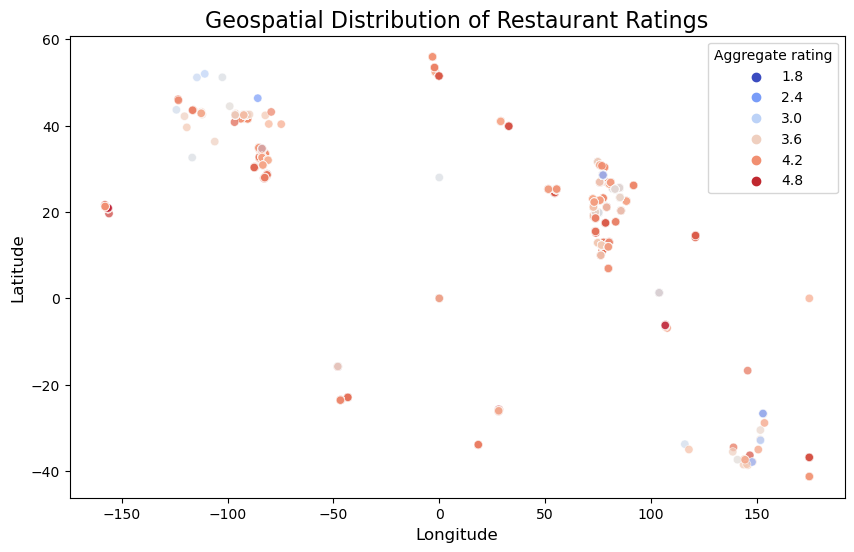

In [33]:
df_filtered = data[data['Aggregate rating'] > 0]
city_ratings = df_filtered.groupby('City')['Aggregate rating'].mean().reset_index()
city_ratings = city_ratings.sort_values(by='Aggregate rating', ascending=False)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_filtered['Longitude'], y=df_filtered['Latitude'], hue=df_filtered['Aggregate rating'], palette="coolwarm", alpha=0.7)
plt.title("Geospatial Distribution of Restaurant Ratings", fontsize=16)
plt.xlabel("Longitude", fontsize=12)
plt.ylabel("Latitude", fontsize=12)
plt.show()

# 4. Table Booking & Online Delivery

In [34]:
total_restaurants = len(data)
table_booking_count = data[data['Has Table booking'] == 'Yes'].shape[0]
table_booking_percentage = (table_booking_count / total_restaurants) * 100
online_delivery_count = data[data['Has Online delivery'] == 'Yes'].shape[0]
online_delivery_percentage = (online_delivery_count / total_restaurants) * 100
both_services_count = data[(data['Has Table booking'] == 'Yes') & (data['Has Online delivery'] == 'Yes')].shape[0]
both_services_percentage = (both_services_count / total_restaurants) * 100
print(f"Percentage of restaurants offering table booking: {table_booking_percentage:.2f}%")
print(f"Percentage of restaurants offering online delivery: {online_delivery_percentage:.2f}%")
print(f"Percentage of restaurants offering both services: {both_services_percentage:.2f}%")

Percentage of restaurants offering table booking: 12.12%
Percentage of restaurants offering online delivery: 25.66%
Percentage of restaurants offering both services: 4.55%


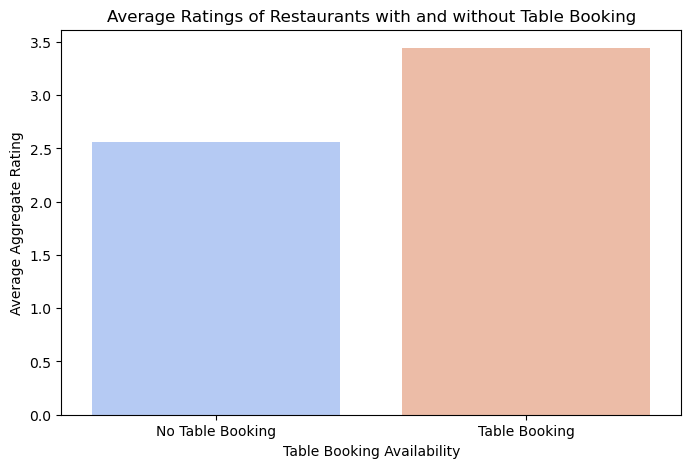

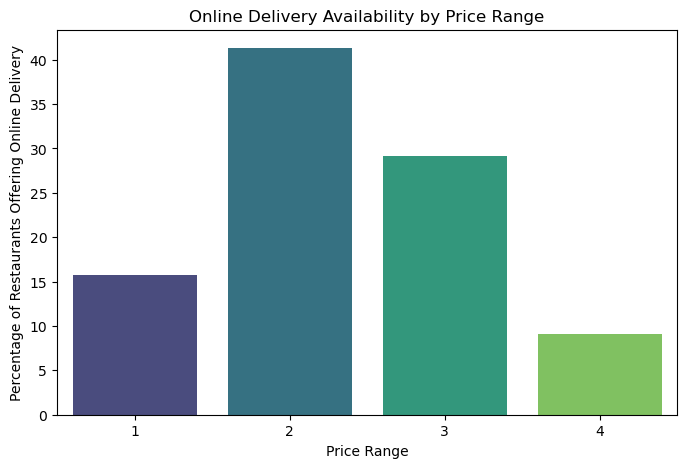

In [35]:
data['Has Table booking'] = data['Has Table booking'].map({'Yes': True, 'No': False})
data['Has Online delivery'] = data['Has Online delivery'].map({'Yes': True, 'No': False})
average_rating_table_booking = data.groupby('Has Table booking')['Aggregate rating'].mean()
plt.figure(figsize=(8, 5))
sns.barplot(x=average_rating_table_booking.index.astype(str), y=average_rating_table_booking.values, palette="coolwarm")
plt.xticks([0, 1], ["No Table Booking", "Table Booking"])
plt.xlabel("Table Booking Availability")
plt.ylabel("Average Aggregate Rating")
plt.title("Average Ratings of Restaurants with and without Table Booking")
plt.show()
online_delivery_distribution = data.groupby('Price range')['Has Online delivery'].mean() * 100  
plt.figure(figsize=(8, 5))
sns.barplot(x=online_delivery_distribution.index, y=online_delivery_distribution.values, palette="viridis")
plt.xlabel("Price Range")
plt.ylabel("Percentage of Restaurants Offering Online Delivery")
plt.title("Online Delivery Availability by Price Range")
plt.show()

# 5. Price Range Analysis

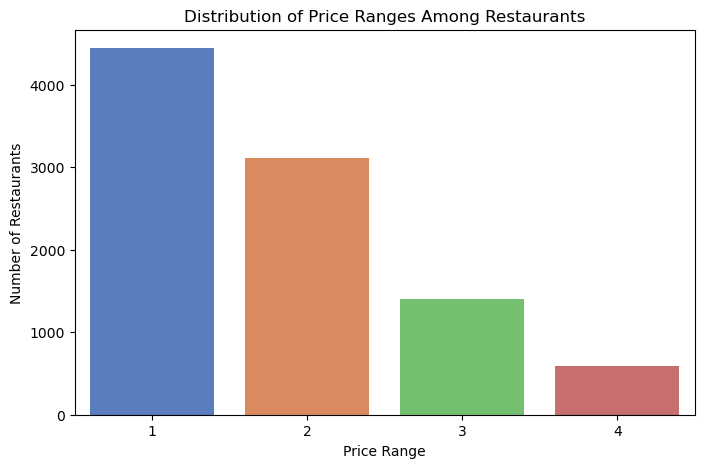

In [36]:
most_common_price_range = data['Price range'].value_counts().idxmax()
plt.figure(figsize=(8, 5))
sns.countplot(x=data['Price range'], palette="muted")
plt.xlabel("Price Range")
plt.ylabel("Number of Restaurants")
plt.title("Distribution of Price Ranges Among Restaurants")
plt.show()

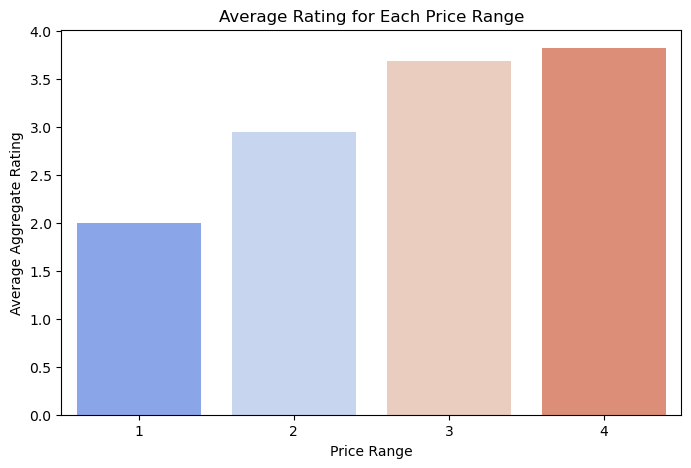

In [37]:
average_rating_per_price = data.groupby('Price range')['Aggregate rating'].mean()
plt.figure(figsize=(8, 5))
sns.barplot(x=average_rating_per_price.index, y=average_rating_per_price.values, palette="coolwarm")
plt.xlabel("Price Range")
plt.ylabel("Average Aggregate Rating")
plt.title("Average Rating for Each Price Range")
plt.show()

In [38]:
highest_avg_rating_colors = data.groupby('Price range')['Rating color'].agg(lambda x: x.mode()[0])
highest_avg_rating_colors_df = highest_avg_rating_colors.reset_index()
highest_avg_rating_colors_df.columns = ['Price Range', 'Most Common Rating Color']
print("Highest Rating Colors for Each Price Range:")
print(highest_avg_rating_colors_df)

Highest Rating Colors for Each Price Range:
   Price Range Most Common Rating Color
0            1                   Orange
1            2                   Orange
2            3                   Yellow
3            4                   Yellow


# 6. Feature Engineering

In [39]:
data['Number of Cuisines'] = data['Cuisines'].fillna("").replace("Unknown", "").apply(lambda x: len(x.split(',')))
data.loc[data['Cuisines'] == "Unknown", 'Number of Cuisines'] = 0
data.to_csv("C:\\Users\\viswa\\Downloads\\Dataset.csv", index=False)

In [40]:
currency_to_inr = {
    "Botswana Pula(P)": 6.10,
    "Brazilian Real(R$)": 17.20,
    "Canadian Dollar(CA$)": 61.50,
    "Indonesian Rupiah(IDR)": 0.0053,
    "NewZealand($)": 52.00,
    "Qatari Rial(QR)": 22.80,
    "Rand(R)": 4.60,
    "Sri Lankan Rupee(LKR)": 0.27,
    "Turkish Lira(TL)": 2.80,
    "UAE Dirham(AED)": 22.50,
    "United States Dollar($)": 83.00,
    "Australian Dollar(A$)": 55.00,
    "British Pound(£)": 105.00,
    "Euro(€)": 90.00,
    "Indian Rupees(INR)": 1.00, 
    "Philippine Peso(P)": 1.48,
    "Singapore Dollar(S$)": 61.00
}
data['Cost in INR'] = data.apply(
    lambda row: row['Average Cost for two'] * currency_to_inr.get(row['Currency'], 1), axis=1
)
data.to_csv("C:\\Users\\viswa\\Downloads\\Dataset.csv", index=False)

In [41]:
data['Has Table Booking (Binary)'] = data['Has Table booking'].astype(str).str.strip().str.lower().map({'Yes': 1, 'No': 0})
data['Has Online Delivery (Binary)'] = data['Has Online delivery'].astype(str).str.strip().str.lower().map({'Yes': 1, 'No': 0})
data['Has Table Booking (Binary)'].fillna(0, inplace=True)
data['Has Online Delivery (Binary)'].fillna(0, inplace=True)
data['Has Table booking'] = data['Has Table booking'].astype(str).replace({'True': 'Yes', 'False': 'No'})
data['Has Online delivery'] = data['Has Online delivery'].astype(str).replace({'True': 'Yes', 'False': 'No'})
data.to_csv("C:\\Users\\viswa\\Downloads\\Dataset.csv", index=False)

## Value For Money 

#### VFM = Price Range / Aggregate Rating

1. Higher ratings at a lower price → Better value for money ✅
2. Lower ratings at a higher price → Poor value for money ❌
3. Higher ratings at a higher price → Still good value, but expected
4. Lower ratings at a lower price → Might still be acceptable

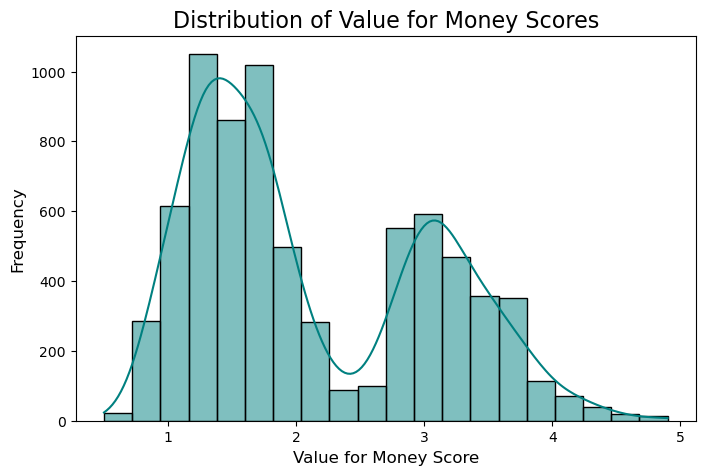

In [42]:
data['Value for Money'] = data['Aggregate rating'] / data['Price range']
data.loc[data['Aggregate rating'] == 0, 'Value for Money'] = np.nan
data.replace([float('inf'), -float('inf')], np.nan, inplace=True)
data.to_csv("C:\\Users\\viswa\\Downloads\\Dataset.csv", index=False, na_rep="NaN")
df_filtered = data[data['Aggregate rating'] > 0] 
plt.figure(figsize=(8, 5))
sns.histplot(df_filtered['Value for Money'], bins=20, kde=True, color='teal')
plt.title('Distribution of Value for Money Scores', fontsize=16)
plt.xlabel('Value for Money Score', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.show()

## Service Availability Score

#### Service Availability Score = (Has Online Delivery + Has Table Booking) × Aggregate Rating

1. Has Online Delivery → 1 if available, 0 if not.
2. Has Table Booking → 1 if available, 0 if not.
3. Aggregate Rating → The restaurant’s rating on a scale of 1 to 5
4. Higher values indicate more convenient restaurants → They have higher ratings and offer multiple services.
5. Restaurants with no services get 0 → Even with high ratings, they might be less accessible to customers.

In [43]:
data['Service Availability Score'] = (data['Has Table Booking (Binary)'] + data['Has Online Delivery (Binary)']) * data['Aggregate rating']
data.loc[data['Aggregate rating'] == 0, 'Service Availability Score'] = np.nan
data.to_csv("C:\\Users\\viswa\\Downloads\\Dataset.csv", index=False)

## Consistency Score

#### Consistency Score = Votes / ( Number of Cuisines + 1 )


The Consistency Score is designed to measure how stable and reliable a restaurant's rating is based on customer engagement (votes) and the variety of cuisines offered.



In [44]:
data['Consistency Score'] = data['Votes'] / (data['Number of Cuisines'] + 1)    
data.to_csv("C:\\Users\\viswa\\Downloads\\Dataset.csv", index=False)

# 7. Predictive Modeling

In [45]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Restaurant ID                 9551 non-null   object 
 1   Restaurant Name               9551 non-null   object 
 2   Country Code                  9551 non-null   int64  
 3   City                          9551 non-null   object 
 4   Address                       9551 non-null   object 
 5   Locality                      9551 non-null   object 
 6   Locality Verbose              9551 non-null   object 
 7   Longitude                     9551 non-null   float64
 8   Latitude                      9551 non-null   float64
 9   Cuisines                      9542 non-null   object 
 10  Average Cost for two          9551 non-null   int64  
 11  Currency                      9551 non-null   object 
 12  Has Table booking             9551 non-null   object 
 13  Has

In [46]:
final_data = data[data['Aggregate rating'] > 0]

In [47]:
X = final_data[['Number of Cuisines', 'Cost in INR', 'Has Table Booking (Binary)',
                'Has Online Delivery (Binary)', 'Value for Money', 'Service Availability Score', 
                'Consistency Score']]
y = final_data['Aggregate rating']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [48]:
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f"Linear Regression Performance:")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R-squared (R²): {r2:.4f}")

Linear Regression Performance:
Mean Absolute Error (MAE): 0.3860
Mean Squared Error (MSE): 0.2417
Root Mean Squared Error (RMSE): 0.4917
R-squared (R²): 0.2184


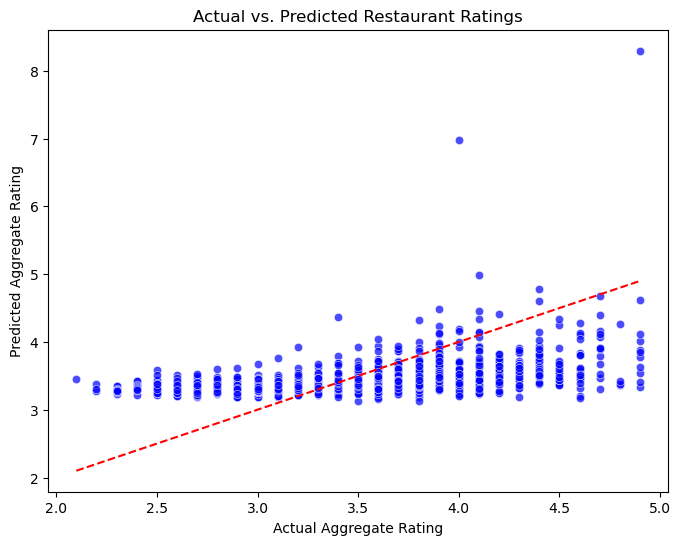

In [49]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.7, color='blue')
plt.xlabel("Actual Aggregate Rating")
plt.ylabel("Predicted Aggregate Rating")
plt.title("Actual vs. Predicted Restaurant Ratings")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red')  
plt.show()

In [50]:
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
y_pred_dt = dt_model.predict(X_test)
mse_dt = mean_squared_error(y_test, y_pred_dt)
rmse_dt = mean_squared_error(y_test, y_pred_dt, squared=False)
mae_dt = mean_absolute_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
print(f"Decision Tree Performance:")
print(f"Mean Absolute Error (MAE): {mae_dt:.4f}")
print(f"Mean Squared Error (MSE): {mse_dt:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_dt:.4f}")
print(f"R-squared (R²): {r2_dt:.4f}\n")
print(f"Random Forest Performance:")
print(f"Mean Absolute Error (MAE): {mae_rf:.4f}")
print(f"Mean Squared Error (MSE): {mse_rf:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_rf:.4f}")
print(f"R-squared (R²): {r2_rf:.4f}")

Decision Tree Performance:
Mean Absolute Error (MAE): 0.0627
Mean Squared Error (MSE): 0.0686
Root Mean Squared Error (RMSE): 0.2619
R-squared (R²): 0.7782

Random Forest Performance:
Mean Absolute Error (MAE): 0.0569
Mean Squared Error (MSE): 0.0308
Root Mean Squared Error (RMSE): 0.1756
R-squared (R²): 0.9003


In [51]:
gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
gbr.fit(X_train, y_train)
gbr_predictions = gbr.predict(X_test)
mae = mean_absolute_error(y_test, gbr_predictions)
mse = mean_squared_error(y_test, gbr_predictions)
rmse = mean_squared_error(y_test, gbr_predictions, squared=False)
r2 = r2_score(y_test, gbr_predictions)
print(f"Gradient Boosting Regressor Performance:")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

Gradient Boosting Regressor Performance:
Mean Absolute Error (MAE): 0.1352
Mean Squared Error (MSE): 0.0531
Root Mean Squared Error (RMSE): 0.2305
R² Score: 0.8282


               Model     MAE     MSE    RMSE      R²
0  Linear Regression  0.3860  0.2417  0.4917  0.2184
1      Decision Tree  0.0627  0.0686  0.2619  0.7782
2      Random Forest  0.0569  0.0308  0.1756  0.9003
3  Gradient Boosting  0.1352  0.0531  0.2305  0.8282


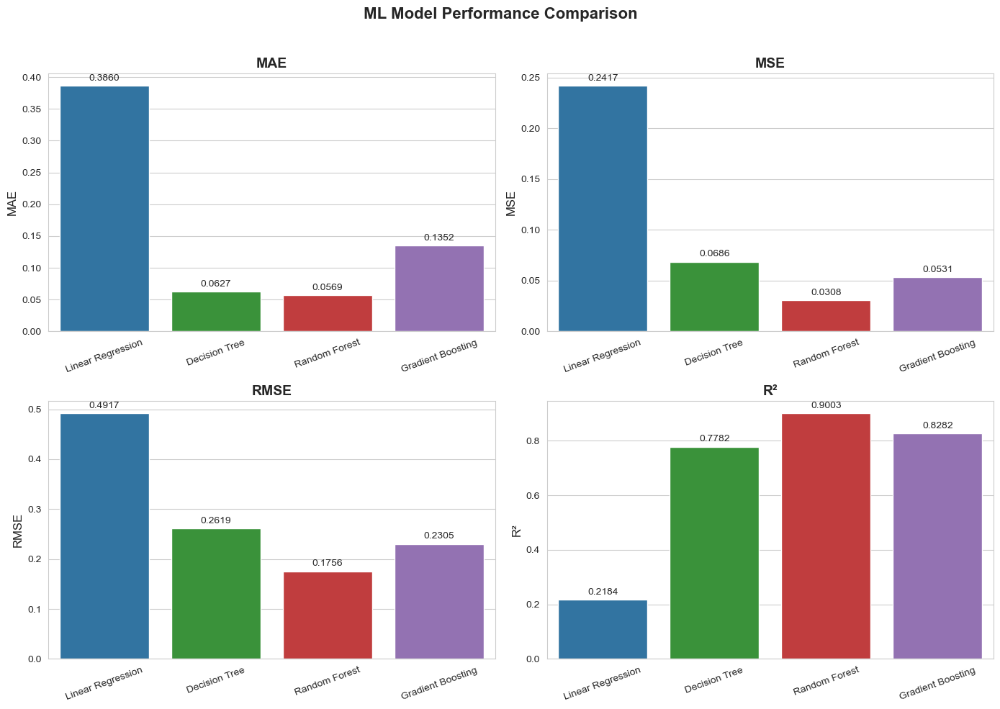

In [52]:
blog = {
    "Model": ["Linear Regression", "Decision Tree", "Random Forest", "Gradient Boosting"],
    "MAE": [0.3860, 0.0627, 0.0569, 0.1352],
    "MSE": [0.2417, 0.0686, 0.0308, 0.0531],
    "RMSE": [0.4917, 0.2619, 0.1756, 0.2305],
    "R²": [0.2184, 0.7782, 0.9003, 0.8282]
}
performance_df = pd.DataFrame(blog)
print(performance_df)
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle("ML Model Performance Comparison", fontsize=16, fontweight='bold')
metrics = ["MAE", "MSE", "RMSE", "R²"]
colors = ["#1f77b4", "#2ca02c", "#d62728", "#9467bd"]
for i, metric in enumerate(metrics):
    ax = axes[i//2, i%2]
    sns.barplot(x="Model", y=metric, data=performance_df, ax=ax, palette=colors)
    ax.set_title(metric, fontsize=14, fontweight='bold')
    ax.set_ylabel(metric, fontsize=12)
    ax.set_xlabel("", fontsize=12)
    ax.tick_params(axis='x', rotation=20)
    for container in ax.containers:
        ax.bar_label(container, fmt="%.4f", fontsize=10, padding=3)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# 8. Customer Preference Analysis

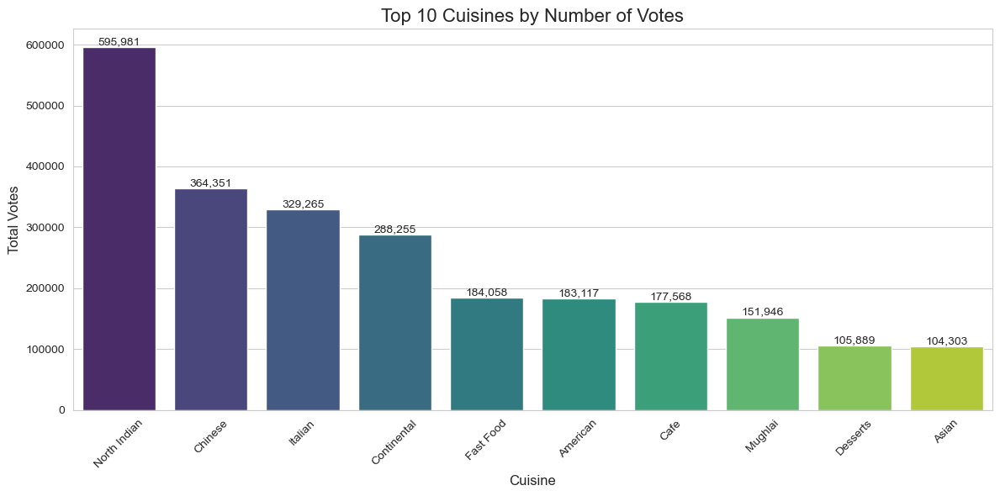

In [53]:
cuisine_votes = defaultdict(int)
for index, row in data.iterrows():
    cuisines = str(row['Cuisines']).split(', ') 
    votes = row['Votes'] if not pd.isna(row['Votes']) else 0  
    for cuisine in cuisines:
        cuisine_votes[cuisine] += votes  
cuisine_votes_df = pd.DataFrame(cuisine_votes.items(), columns=['Cuisine', 'Total Votes'])
cuisine_votes_df = cuisine_votes_df.sort_values(by='Total Votes', ascending=False)
top_cuisines = cuisine_votes_df.head(10)
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=top_cuisines['Cuisine'], y=top_cuisines['Total Votes'], palette='viridis')
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height):,}',  
                (p.get_x() + p.get_width() / 2, height), 
                ha='center', va='bottom', fontsize=10)
plt.title('Top 10 Cuisines by Number of Votes', fontsize=16)
plt.xlabel('Cuisine', fontsize=12)
plt.ylabel('Total Votes', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()

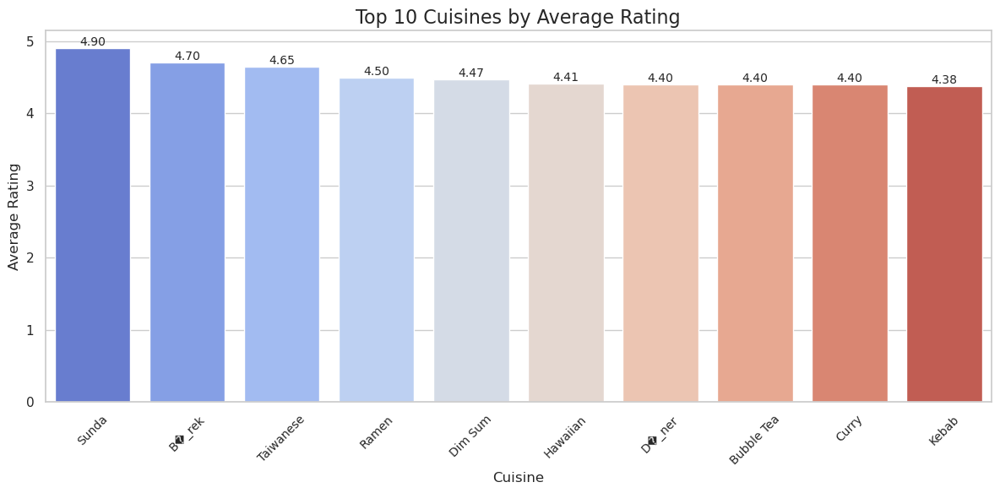

In [54]:
cuisine_ratings = defaultdict(lambda: {'Total Rating': 0, 'Count': 0})
for index, row in data.iterrows():
    cuisines = str(row['Cuisines']).split(', ')  
    rating = row['Aggregate rating']  
    for cuisine in cuisines:
        cuisine_ratings[cuisine]['Total Rating'] += rating  
        cuisine_ratings[cuisine]['Count'] += 1  
cuisine_avg_ratings = {
    cuisine: values["Total Rating"] / values["Count"] 
    for cuisine, values in cuisine_ratings.items() if values["Count"] > 0
}
cuisine_avg_ratings_df = pd.DataFrame(cuisine_avg_ratings.items(), columns=['Cuisine', 'Average Rating'])
cuisine_avg_ratings_df = cuisine_avg_ratings_df.sort_values(by='Average Rating', ascending=False)
top_cuisines_by_rating = cuisine_avg_ratings_df.head(10)
sns.set_theme(style="whitegrid")
plt.rcParams["font.family"] = "DejaVu Sans"
plt.rcParams['axes.unicode_minus'] = False  
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=top_cuisines_by_rating['Cuisine'], y=top_cuisines_by_rating['Average Rating'], palette='coolwarm')
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}', 
                (p.get_x() + p.get_width() / 2, height), 
                ha='center', va='bottom', fontsize=10)
plt.title('Top 10 Cuisines by Average Rating', fontsize=16)
plt.xlabel('Cuisine', fontsize=12)
plt.ylabel('Average Rating', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()

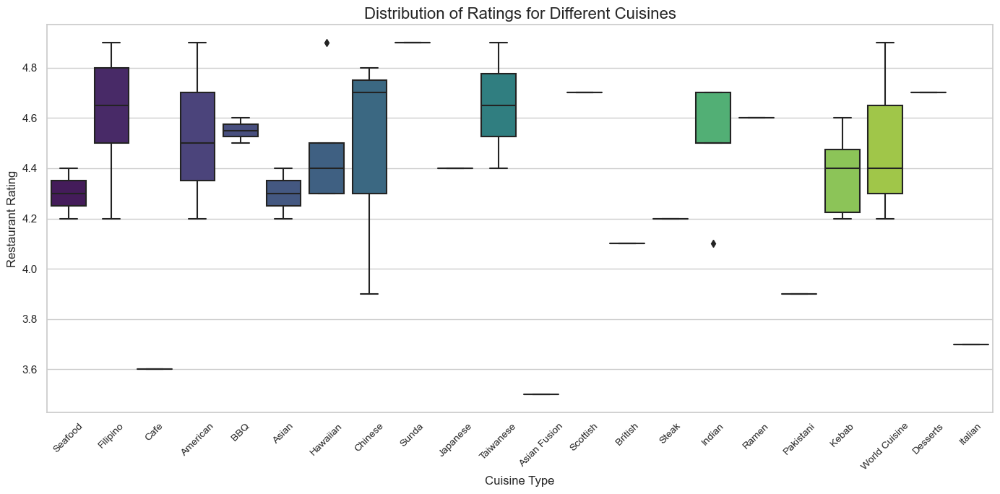

In [55]:
for index, row in data.iterrows():
    cuisines = str(row['Cuisines']).split(',')  
    rating = row['Aggregate rating']  
    for cuisine in cuisines:
        cuisine_ratings[cuisine]['Total Rating'] += rating  
        cuisine_ratings[cuisine]['Count'] += 1  
cuisine_avg_ratings = {
    cuisine: values["Total Rating"] / values["Count"] 
    for cuisine, values in cuisine_ratings.items() if values["Count"] > 0
}
cuisine_avg_ratings_df = pd.DataFrame(cuisine_avg_ratings.items(), columns=['Cuisine', 'Average Rating'])
cuisine_avg_ratings_df = cuisine_avg_ratings_df.sort_values(by='Average Rating', ascending=False)
top_cuisines_by_rating = cuisine_avg_ratings_df.head(10)
top_20_cuisines = cuisine_avg_ratings_df['Cuisine'].head(20).tolist()
df_filtered = data[data['Cuisines'].apply(lambda x: any(cuisine in str(x) for cuisine in top_20_cuisines))].copy()  # <--- FIXED HERE
df_filtered.loc[:, 'Primary Cuisine'] = df_filtered['Cuisines'].apply(lambda x: str(x).split(', ')[0])
sns.set_theme(style="whitegrid")
plt.figure(figsize=(14, 7))
ax = sns.boxplot(x='Primary Cuisine', y='Aggregate rating', data=df_filtered, palette='viridis')
plt.xticks(rotation=45, fontsize=10)
plt.title('Distribution of Ratings for Different Cuisines', fontsize=16)
plt.xlabel('Cuisine Type', fontsize=12)
plt.ylabel('Restaurant Rating', fontsize=12)
plt.tight_layout()
plt.show()

# 9. Data Visualisation

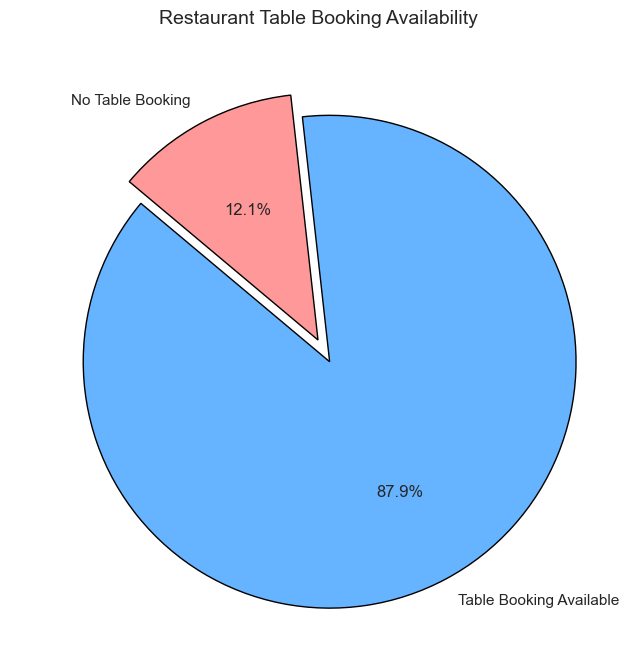

In [56]:
table_booking_counts = data['Has Table booking'].value_counts()
colors = ['#66b3ff', '#ff9999']  
labels = ['Table Booking Available', 'No Table Booking']
plt.figure(figsize=(8, 8))
plt.pie(table_booking_counts, labels=labels, autopct='%1.1f%%', colors=colors, 
        startangle=140, wedgeprops={'edgecolor': 'black'}, explode=[0.1, 0])  
plt.title('Restaurant Table Booking Availability', fontsize=14)
plt.show()

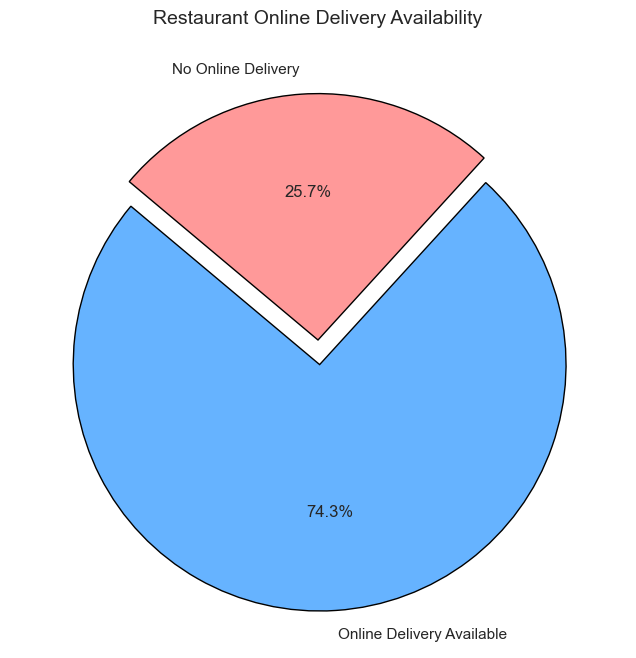

In [57]:
online_delivery_counts = data['Has Online delivery'].value_counts()
labels = ['Online Delivery Available', 'No Online Delivery']
colors = ['#66b3ff', '#ff9999'] 
plt.figure(figsize=(8, 8))
plt.pie(online_delivery_counts, labels=labels, autopct='%1.1f%%', colors=colors, 
        startangle=140, wedgeprops={'edgecolor': 'black'}, explode=[0.1, 0])  
plt.title('Restaurant Online Delivery Availability', fontsize=14)
plt.show()

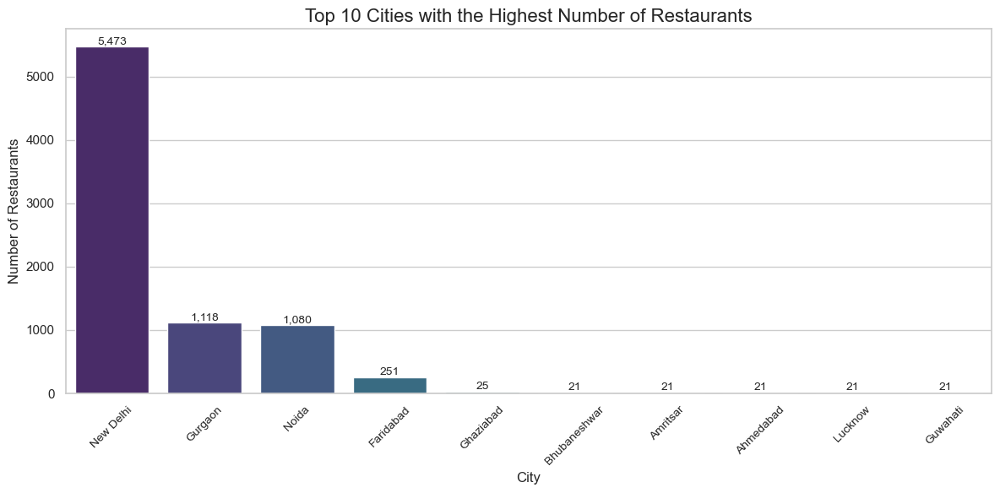

In [58]:
city_restaurant_counts = data['City'].value_counts()
top_10_cities = city_restaurant_counts.head(10)
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=top_10_cities.index, y=top_10_cities.values, palette="viridis")
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height):,}', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=10)
plt.title('Top 10 Cities with the Highest Number of Restaurants', fontsize=16)
plt.xlabel('City', fontsize=12)
plt.ylabel('Number of Restaurants', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()

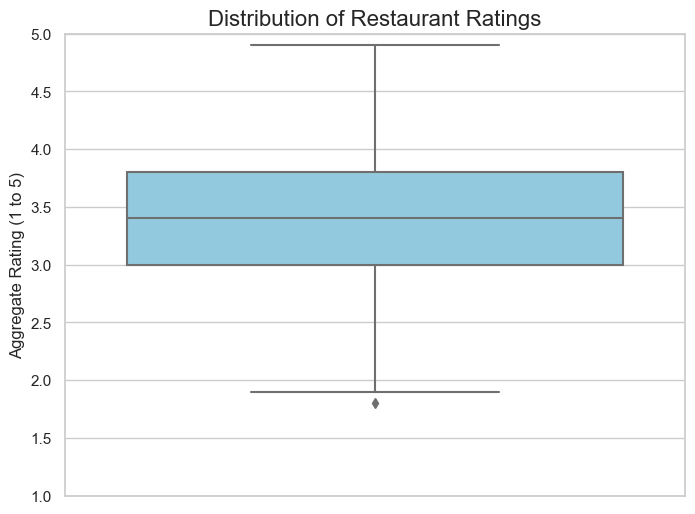

In [59]:
df_filtered = data[data['Aggregate rating'] > 0] 
plt.figure(figsize=(8, 6))
ax = sns.boxplot(y=df_filtered['Aggregate rating'], color="skyblue")
ax.set_ylim(1, 5)
plt.title('Distribution of Restaurant Ratings', fontsize=16)
plt.ylabel('Aggregate Rating (1 to 5)', fontsize=12)
plt.show()

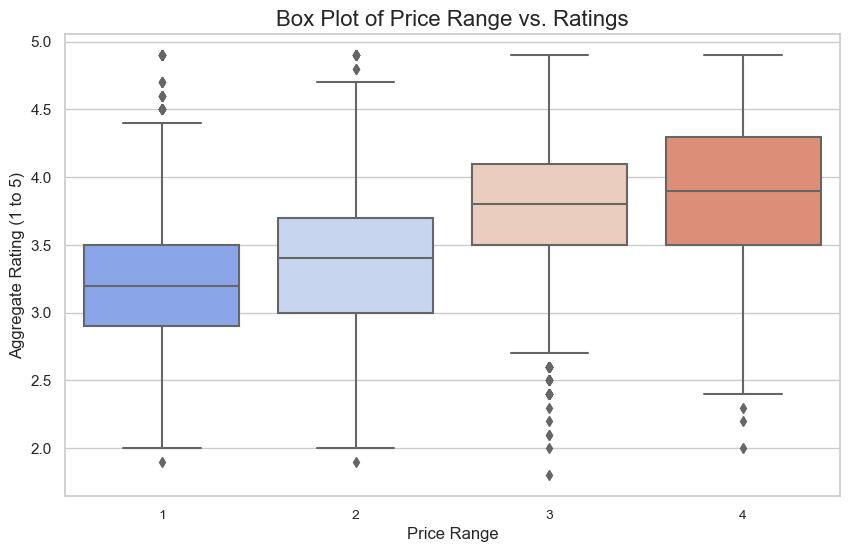

In [60]:
df_filtered = data[data['Aggregate rating'] > 0]  
plt.figure(figsize=(10, 6))
ax = sns.boxplot(x=df_filtered['Price range'], y=df_filtered['Aggregate rating'], palette="coolwarm")
plt.title('Box Plot of Price Range vs. Ratings', fontsize=16)
plt.xlabel('Price Range', fontsize=12)
plt.ylabel('Aggregate Rating (1 to 5)', fontsize=12)
plt.xticks(rotation=0, fontsize=10)
plt.show()

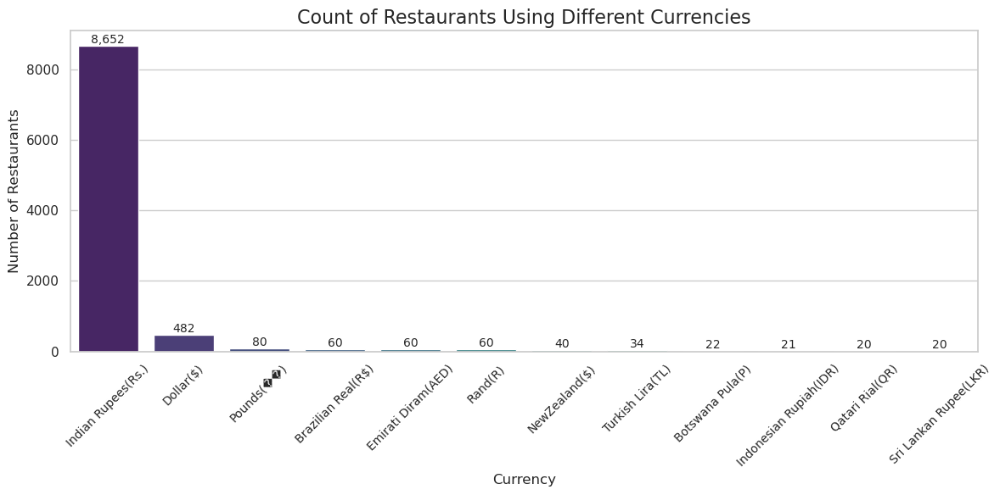

In [61]:
plt.rcParams["font.family"] = "DejaVu Sans"  
plt.rcParams['axes.unicode_minus'] = False
currency_counts = data['Currency'].value_counts()
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=currency_counts.index, y=currency_counts.values, palette="viridis")
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height):,}', 
                (p.get_x() + p.get_width() / 2, height), 
                ha='center', va='bottom', fontsize=10)
plt.title('Count of Restaurants Using Different Currencies', fontsize=16)
plt.xlabel('Currency', fontsize=12)
plt.ylabel('Number of Restaurants', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()

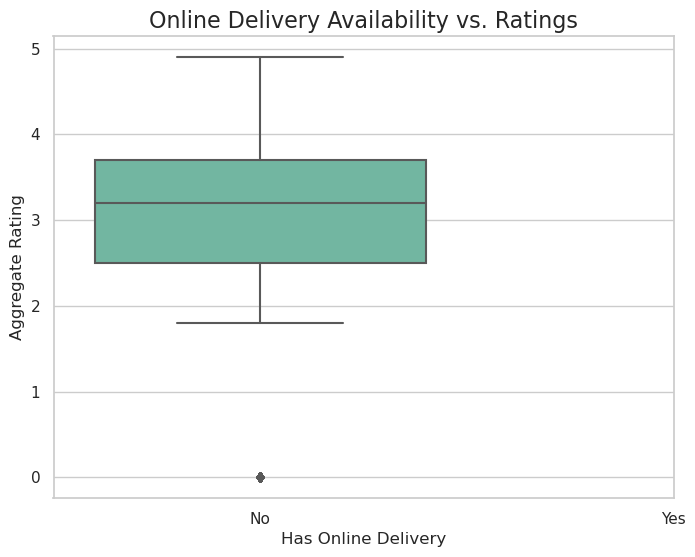

In [62]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['Has Online Delivery (Binary)'], y=data['Aggregate rating'], palette="Set2")
plt.title("Online Delivery Availability vs. Ratings", fontsize=16)
plt.xlabel("Has Online Delivery", fontsize=12)
plt.ylabel("Aggregate Rating", fontsize=12)
plt.xticks(ticks=[0, 1], labels=["No", "Yes"])
plt.show()

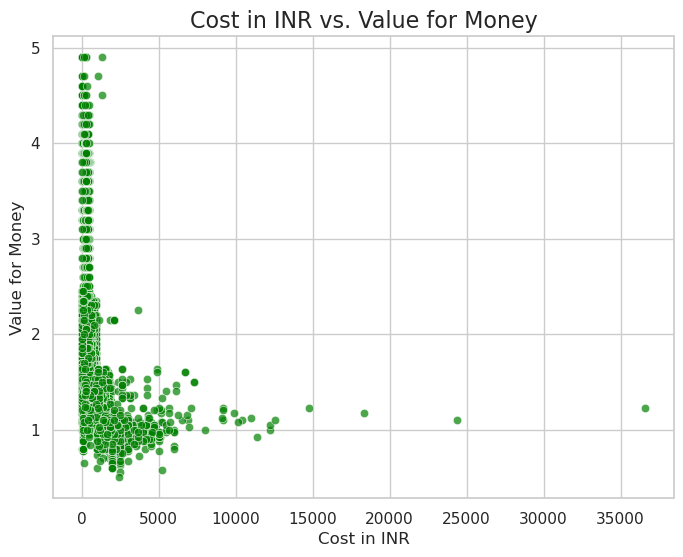

In [63]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data['Cost in INR'], y=data['Value for Money'], alpha=0.7, color='green')
plt.title("Cost in INR vs. Value for Money", fontsize=16)
plt.xlabel("Cost in INR", fontsize=12)
plt.ylabel("Value for Money", fontsize=12)
plt.show()

It shows a clear trend that lower-cost restaurants tend to provide better value. It challenges the assumption that expensive restaurants offer better experiences. It helps customers find the best value by identifying which price range typically offers better ratings relative to cost.